# Segmentation / Parcellation

## Objectives
- Understand and visualize tissue segmentation
- Manipulate atlases to extract regions of interests
- Visualize and interact with both volumetric and surface data

## Useful resources:
- FreeSurfer output [description](https://surfer.nmr.mgh.harvard.edu/fswiki/ReconAllTableStableV5.3)

## Dataset used:
- [AOMIC](https://nilab-uva.github.io/AOMIC.github.io/): the Amsterdam Open MRI [Collection](https://openneuro.org/datasets/ds002790/versions/2.0.0)

In [327]:
import os
import numpy as np
import pandas as pd
import nibabel as nib
from nilearn import plotting
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import seaborn as sns

In [328]:
%matplotlib inline

In [329]:
# set up paths
local_data_dir = '../data/'

freesurfer_output_dir = os.path.join(local_data_dir, 'AOMIC/derivatives/freesurfer/sub-0001/mri/')
fsaverage_dir = os.path.join(local_data_dir, 'AOMIC/derivatives/freesurfer/fsaverage5/mri/')

fsl_output_dir = os.path.join(local_data_dir, 'AOMIC/derivatives/fsl/')

## Brain tissue segmentation

Segmentation uses information in our image to classify structures of interest. In otherwords, which voxels represent grey matter (GM), white matter (WM) and cerebrospinal fluid (CSF)?


### T1 data

In [330]:
# Use the bias corrected T1 images from FreeSurfer output
t1_file = os.path.join(freesurfer_output_dir + 'nu.mgz')

# Load it with nibabel
t1 = nib.load(t1_file)
t1_data = t1.get_fdata()
t1_affine = t1.affine

### Brain mask data

Lets load the brain image we extracted from the skull in the image cleanup lesson

In [331]:
# Load FreeSurfer data
t1_masked_file = os.path.join(fsl_output_dir, 'brain_extracted.nii.gz')

# Load it with nibabel
t1_masked = nib.load(t1_masked_file)
t1_masked_data = t1_mask.get_fdata()

Lets visualise these images again to remind ourselves about brain masking.

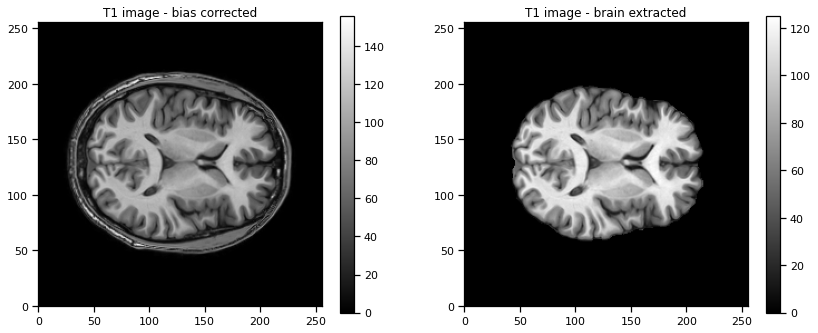

In [332]:
plt.figure(figsize=(14, 12))

# plot the T1 image
plt.subplot(2, 2, 1)
plt.imshow(t1_data[:, 140, :], origin="lower", cmap="gray")
plt.title('T1 image - bias corrected')
plt.colorbar();

# Plot FreeSurfer's 'brainmask' (i.e. skull stripped brain)
plt.subplot(2, 2, 2)
plt.imshow(t1_masked_data[:, 140, :], origin="lower", cmap="gray")
plt.title('T1 image - brain extracted')
plt.colorbar();

On the right, we've removed structures of the head we are not interested in like the skull. We should only have brain tissue and the surrounding cerebrospinal fluid left in our image.

We can visualise this in a histogram of the voxel intensities we previously created in the image cleanup session.

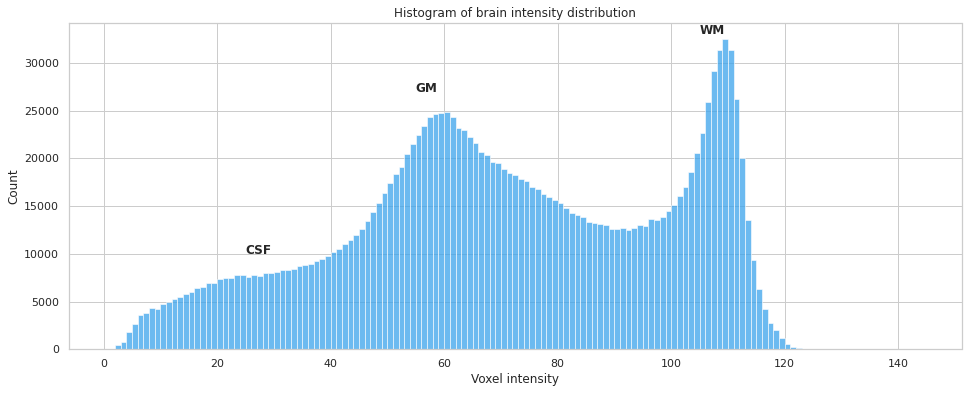

In [333]:
# set options for the plot
sns.set_context("notebook", font_scale=1, rc={"lines.linewidth": 2.5})
palette = sns.color_palette("husl", 3)

# using this axis style
with sns.axes_style("whitegrid"):
    
    # set up figure
    plt.figure(figsize=(16, 6))
    
    # plot histogram
    g = sns.histplot(t1_masked_data[t1_masked_data != 0], bins='auto', binwidth=1, kde=False, color=palette[2])
    
    plt.xlabel('Voxel intensity')
    plt.text(25, 10000, "CSF", size='medium', weight='bold')
    plt.text(55, 27000, "GM", size='medium', weight='bold')
    plt.text(105, 33000, "WM", size='medium', weight='bold')
    plt.title('Histogram of brain intensity distribution')


In [334]:
# load fsl segmentation
fsl_seg_file = os.path.join(fsl_output_dir, 'brain_extracted_seg.nii.gz')
fsl_seg_img = nib.load(fsl_seg_file)
fsl_seg_data = fsl_seg_img.get_fdata()


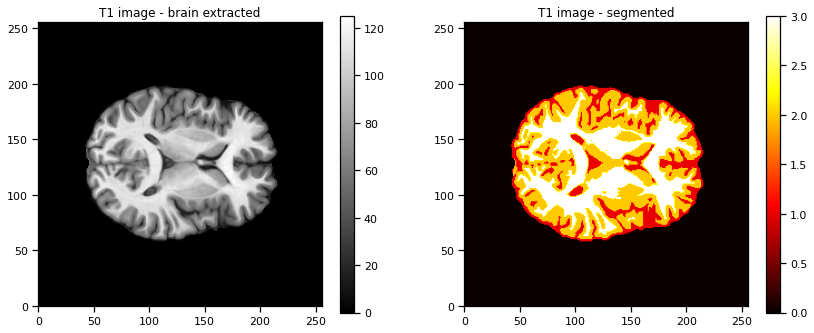

In [335]:
plt.figure(figsize=(14, 12))

# Plot brain extracted T1 image
plt.subplot(2, 2, 1)
plt.imshow(t1_masked_data[:, 140, :], origin="lower", cmap="gray")
plt.title('T1 image - brain extracted')
plt.colorbar();

# plot the segmented image
plt.subplot(2, 2, 2)
plt.imshow(fsl_seg_data[:, 140, :], origin="lower", cmap="hot")
plt.title('T1 image - segmented');
plt.colorbar();

In [336]:
# each voxel has been assigned a tissue class based on its voxel intensity
labels = np.unique(fsl_seg_data[fsl_seg_data != 0]).astype('int')

# looking at the segmentation plot, we can see lowest label is CSF, middle is GM and highest is WM.
print('CSF =', labels[0])
print('GM =', labels[1])
print('WM =', labels[2])

CSF = 1
GM = 2
WM = 3


In [337]:
# lets use indexing again to extract voxels in the T1 image that correspond to each tissue class
csf = t1_masked_data[fsl_seg_data == labels[0]]

#### Challenge: Can you repeat this for GM and WM?

Solution

In [338]:
gm = t1_masked_data[fsl_seg_data == labels[1]]
wm = t1_masked_data[fsl_seg_data == labels[2]]

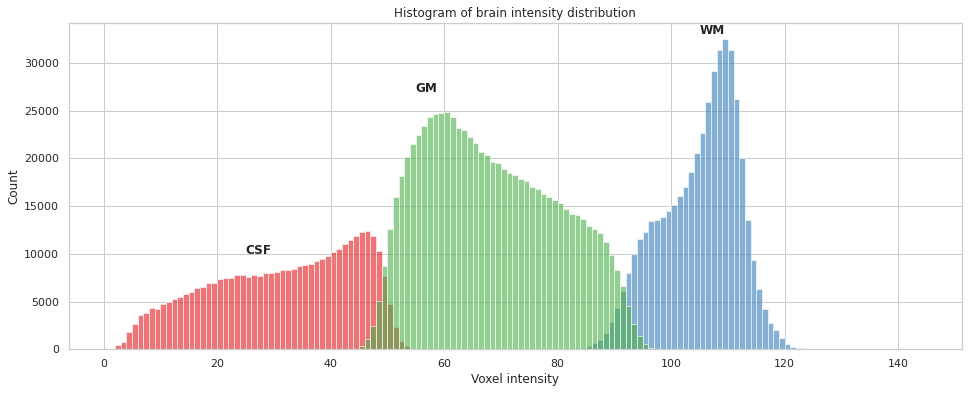

In [339]:
# lets see what these tissue classes look like on the histogram we plotted before

# set the palette
palette = sns.color_palette("Set1")

# with this axis style
with sns.axes_style("whitegrid"):
    
    # set up figure
    plt.figure(figsize=(16, 6))
    
    # plot histogram of each tissue class (separate colours in palette)
    g = sns.histplot(csf, bins='auto', binwidth=1, kde=False, color=palette[0], alpha=0.6)
    g = sns.histplot(wm, bins='auto', binwidth=1, kde=False, color=palette[1], alpha=0.6)
    g = sns.histplot(gm, bins='auto', binwidth=1, kde=False, color=palette[2], alpha=0.6)
    
    plt.xlabel('Voxel intensity')
    plt.text(25, 10000, "CSF", size='medium', weight='bold')
    plt.text(55, 27000, "GM", size='medium', weight='bold')
    plt.text(105, 33000, "WM", size='medium', weight='bold')
    plt.title('Histogram of brain intensity distribution')

The peaks in the histogram represent different brain tissues. This is an important step which allows us to quantify both where brain tissue is and how much brain tissue there is in each brain image.

What do you think about the voxel intensities that have overlapping tissue classes? Where in the brain would these exist?

#### Challenge: Can you extract the voxels in `t1_masked_data` that have intensities between 85 and 95? 

1. Assign the voxels between these intensities with a value of `1` and those outside this range with value of `0`.

2. Call your new array: `t1_masked_pv`

*Hint*: Think back to the image clean up lesson where we used `np.where` to preserve the shape of our image while indexing.

Solution

In [340]:
t1_masked_pv = np.where((t1_masked_data > 84) & (t1_masked_data < 96), 1, 0)

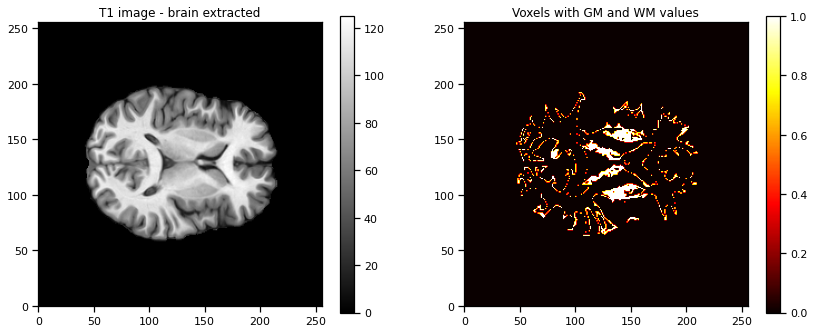

In [341]:
# let plot to visualise this
plt.figure(figsize=(14, 12))

# Plot brain extracted T1 image
plt.subplot(2, 2, 1)
plt.imshow(t1_masked_data[:, 140, :], origin="lower", cmap="gray")
plt.title('T1 image - brain extracted')
plt.colorbar();

# plot the segmented image
plt.subplot(2, 2, 2)
plt.imshow(t1_masked_pv[:, 140, :], origin="lower", cmap="hot")
plt.title('Voxels with GM and WM values');
plt.colorbar();


It looks like these overlapping intensities are distributed on the boundary between GM and WM tissues!

Lets save the image so we can view it using `nilearn` for a better look.

In [353]:
# create the image - it has the same orientation as the t1_mask, so use that affine.
t1_pve_img = nib.Nifti1Image(t1_masked_pv, t1_mask.affine)

The `plot_roi` function in `nilearn` overlays a region we have segmented on top of an anatomical image

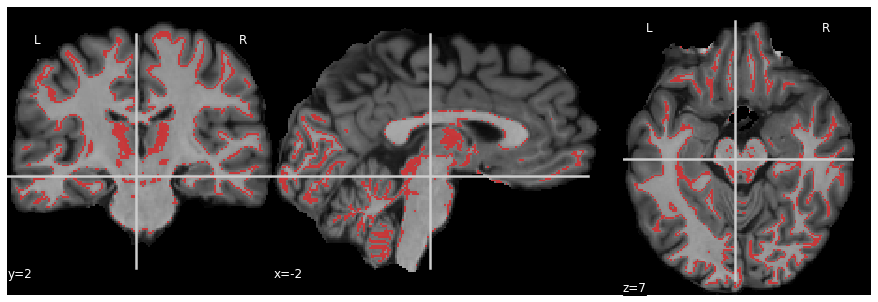

In [354]:
# create our figure
fig = plt.figure(figsize=(12, 4))

# plot our overlapping voxel image on top ouf our brain extracted T1 image
plotting.plot_roi(roi_img=t1_pve_img, bg_img=t1_masked_file, figure=fig, dim=0.5, cmap="Set1");

These voxels with overlapping signal intensities certainly occur on the boundaries between GM and WM tissues.

This is an important concept in neuroimaging called **partial volume effects**. 

The detail of brain tissue is much greater than what we can acquire with neuroimaging techniques. This results in uncertainty around which tissue some voxels represent.

### Probability map

This uncertainty around partial volume effects means tissue segmentations are often represented as probabilities.

For example, voxels with greater certainty of belonging to a tissue class have values closer to 1.

We have created a GM probability map for you. Visualise it below

In [344]:
# probability map created by FSL's FAST pipeline
GM_probmap_file = os.path.join(fsl_output_dir, 'brain_extracted_prob_1.nii.gz')

# Load it with nibabel
GM_probmap = nib.load(GM_probmap_file)

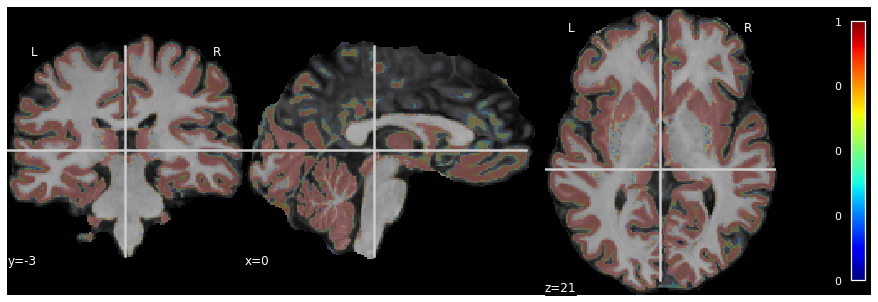

In [345]:
# create figure
fig = plt.figure(figsize=(12, 4))

# use plot_roi again
plotting.plot_roi(roi_img=GM_probmap, bg_img=t1_masked_file, alpha=0.2, figure=fig, colorbar=True, dim=0.5,
                  cmap="jet", vmin=0.5, vmax=1);

Voxels on the edge of GM are assigned a lower probability (yellow/green).

## Surface data

FreeSurfer goes further than assigning voxels to a tissue class and produces a 3D *surface* that represents the folds of the brain.

Lets visualise the surface at the edge of the GM (otherwise called pial surface) using `nilearn`.

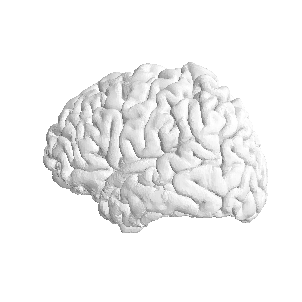

In [346]:
# freesurfer processes the brain one hemisphere at a time
# lets find the left hemisphere (lh) pial surface
lh_pial_file = os.path.join('../data/AOMIC/derivatives/freesurfer/sub-0001/surf/lh.pial')

# plot is using nilearn's plot_surf command
plotting.plot_surf(surf_mesh=lh_pial_file);

We can also view the surface interactively, try the code below:

In [347]:
plotting.view_surf(surf_mesh=lh_pial_file, black_bg=True)

##### Challenge: can you modify the code above to plot the white matter surface ? 

## Parcellation

We can go a step further than broad brain tissue classes (GM, WM and CSF) by splitting the GM into smaller regions.

Different brain areas have specialised functions (e.g. vision, memory and motor functions). Quantifying these regions could reveal differences between healthy individuals and patient groups.



In [348]:
dk_parcellation = os.path.join(freesurfer_output_dir, 'aparc+aseg.mgz')

In [349]:
def read_freesurfer_lut(lut):
    '''
    Read and parse freesurfer look up table into python.
    Credit here: https://gist.github.com/rmukh/a655b5ac16a37d72cb6f20747664e4af
    :param lut: path to look up table from freesurfer
    :return: rgb values for each label, value:label name dictionary
    '''

    import numpy as np
    import regex

    # set up colour table and name dict
    rgb = np.empty((0, 4), dtype=np.int64)
    label_names = {}

    # read lines in the look up table
    with open(lut, 'r') as f:
        raw_lut = f.readlines()

    # regex the strings in lut and create rgb and label objects
    pattern = regex.compile(r'\d{1,5}[ ]+[a-zA-Z-_0-9*.]+[ ]+\d{1,3}[ ]+\d{1,3}[ ]+\d{1,3}[ ]+\d{1,3}')
    for line in raw_lut:
        if pattern.match(line):
            s = line.rstrip().split(' ')
            s = list(filter(None, s))
            rgb = np.append(rgb, np.array([[int(s[0]), int(s[2]), int(s[3]), int(s[4])]]), axis=0)
            label_names[int(s[0])] = s[1]

    # return rgb values and label names
    return rgb, label_names

# the freesurfer look up table is saved below
fs_lut = os.path.join('../data/AOMIC/FreeSurfer.lut')

# use the function above to extract RGB and label values
rgb, labels = read_freesurfer_lut(fs_lut)

# convert to matplotlib colourmap
plot_rgb = np.zeros(rgb.shape, dtype=float)
plot_rgb[:,0:3] = rgb[:,1:4]/255.0
plot_rgb[:,3] = 1

# create a colormap for matplotlib
fs_cmap = ListedColormap(plot_rgb, name="fs_lut")

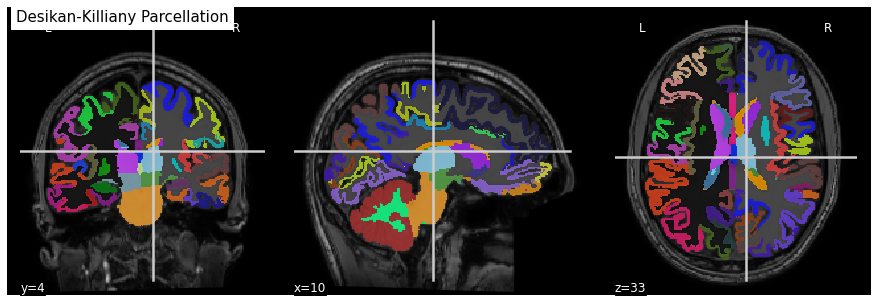

In [350]:
# create the figure
fig = plt.figure(figsize=(12, 4))

# plot the freesurfer parcellation over the normalised T1 image
# this uses the custom colormap create above to visualise the different GM parcellations
plotting.plot_roi(roi_img=dk_parcellation, bg_img=t1, alpha=0.8, cmap=fs_cmap, dim=0.5,
                  title="Desikan-Killiany Parcellation", figure=fig);

There are many parcellations using varying boundaries. The Destrieux atlas parcellates sub brain regions into even smaller regions based on the curvature of cortical GM.

In [351]:
dsx_parcellation = os.path.join(freesurfer_output_dir, 'aparc.a2009s+aseg.mgz')

#### Challenge: Can you plot the Destrieux atlas parcellation on top of the T1 image using the `plot_roi` function?

Solution

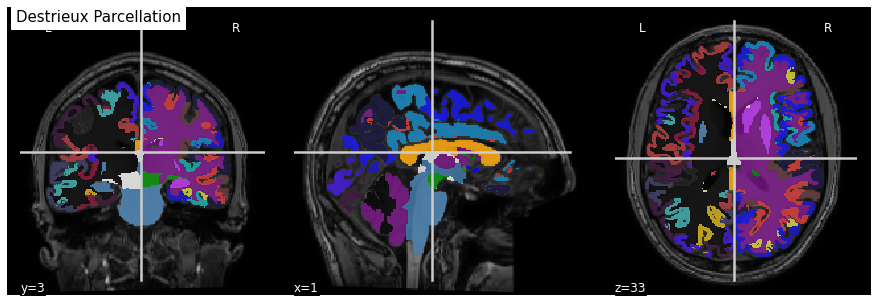

In [352]:
fig = plt.figure(figsize=(12, 4))

plotting.plot_roi(roi_img=dsx_parcellation, bg_img=t1, alpha=0.8, cmap=fs_cmap, dim=0.5,
                  title="Destrieux Parcellation", figure=fig);